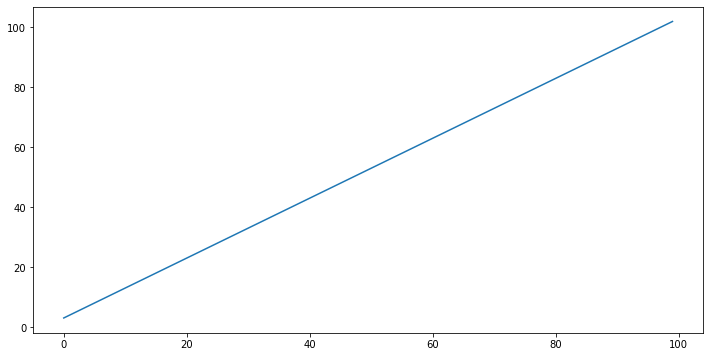

array([  3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,
        16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,
        29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,
        55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,
        68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
        81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101, 102])

In [1]:
##lineAndRandomPoints
import numpy as np
import matplotlib.pyplot as plt

line = np.array([i + 3 for i in range(100)])
figure = plt.figure(figsize = (12,6))
plt.plot(line)
plt.show()
line

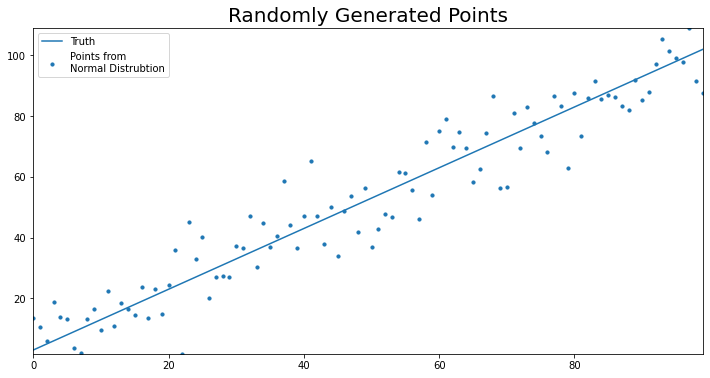

In [2]:
import random

points = []
for point in line:
    points.append(random.normalvariate(point, 10))

figure = plt.figure(figsize = (12, 6))
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.plot(line, label ="Truth")
plt.scatter(np.arange(len(points)), points, s = 10,
           label = "Points from\nNormal Distrubtion")
plt.title("Randomly Generated Points", fontsize = 20)
plt.legend(loc = "best")
plt.show()

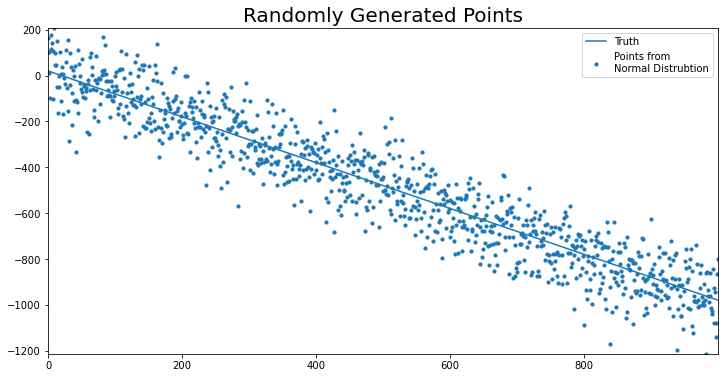

In [3]:
import random

def build_random_data_with_line(y_int, slope, SD = 1, line_length = 100):
    line = np.array([slope * i + y_int for i in range(line_length)])    
    points = []
    for point in line:
        points.append(random.normalvariate(point, SD))
        
    return line, points

def plot_line(line, points, line_name = "Truth",
              title = "Randomly Generated Points"):

    figure = plt.figure(figsize = (12, 6))
    plt.rcParams["axes.xmargin"] = 0
    plt.rcParams["axes.ymargin"] = 0
    plt.plot(line, label =line_name)
    plt.scatter(np.arange(len(points)), points, s = 10,
               label = "Points from\nNormal Distrubtion")
    plt.title("Randomly Generated Points", fontsize = 20)
    plt.legend(loc = "best")
    plt.show()
    
line, points = build_random_data_with_line(y_int = 20, slope = -1, SD = 100, line_length = 1000)
plot_line(line, points)

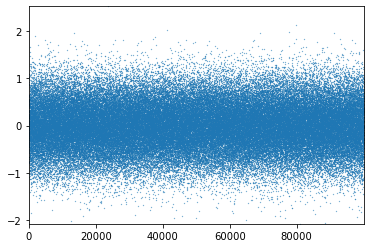

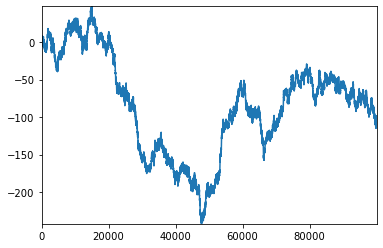

In [4]:
#montecarloSimulation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random


mu = 0
#SD is sigma, variance is sigma**2
sigma = .5
random_list = []
observations = 100000
for i in range(100000):
    random_list.append(random.normalvariate(mu, sigma))

plt.plot(random_list, ls = "",linewidth = 1, marker =".", markersize = .5)
plt.show()
plt.close()

simulation = [] 

for i in range(len(random_list)):
    val = random_list[i]
    if i == 0:
        simulation.append(val)
    else:
        simulation.append(simulation[i-1] + val)
        
plt.plot(simulation)
plt.show()
plt.close()



In [5]:
mean = 0
sigma = 1
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 1000
for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    for period in range(periods):
        # create variable that references simulation i 
        # in the dictionary
        curr_sim = monte_carlo_sim_dict[i]
        if period == 0:
            curr_sim[period] = random.normalvariate(mean, sigma)
        else:
            curr_sim[period] = curr_sim[period - 1] + random.normalvariate(mean, sigma)
        
monte_carlo_sim_df = (pd.DataFrame(monte_carlo_sim_dict))
        
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.598884,1.096412,-0.000792,-0.701431,1.806369,0.110305,0.175098,1.857600,1.200233,1.018155,...,1.318537,-1.064250,-0.901846,1.487832,-0.305943,-1.504587,0.158022,-0.797247,1.326407,-0.302669
1,1.317030,1.546406,1.025020,-0.056053,1.056444,1.339355,1.557877,3.276723,2.062548,-0.643489,...,2.800352,-2.687957,-1.257747,1.746503,-0.082261,-0.419005,-0.651691,0.160802,2.271194,0.014622
2,2.355372,0.501474,1.782920,1.543367,1.582801,1.130157,2.991130,4.351372,1.891789,-0.157021,...,2.113054,-2.401069,-2.107100,-0.619312,-0.304064,-1.357268,-0.091950,1.154062,1.943662,0.335163
3,1.978051,1.469786,3.566864,2.789310,2.338777,0.881070,3.327032,2.081842,0.913997,-1.080574,...,1.594198,-3.072654,-3.516396,0.761194,0.991673,-1.642587,-0.236187,0.609584,1.710989,2.611086
4,1.994816,1.456340,3.613471,2.663402,2.448328,1.816085,4.589977,-0.264370,0.793718,-0.062501,...,1.672897,-4.206457,-2.494410,1.070479,-0.437995,-1.525246,0.428323,0.111706,1.183787,1.861224
5,1.674444,0.622968,4.622370,3.517935,2.496315,1.787539,4.945776,1.450087,2.201226,-0.817464,...,0.713265,-2.599337,-1.758351,-0.266033,1.576959,-0.846261,1.222264,0.011889,-0.157305,2.897033
6,0.401559,0.243131,3.546783,2.263344,2.080684,1.271612,5.685226,3.520715,2.949152,-0.692225,...,1.037630,-2.655103,-1.868311,-0.111425,1.156333,-0.222766,1.351341,0.040258,0.118392,2.696143
7,-1.579148,0.542248,3.122251,3.541610,2.143471,2.252577,6.241966,4.296144,2.514721,1.213642,...,0.758483,-1.721532,-2.636570,-0.245502,1.286179,-0.145334,0.923689,1.416226,0.661093,0.895919
8,-1.934243,0.870792,2.030871,5.370306,-0.289722,1.196493,7.210935,3.289315,3.628252,3.422068,...,-0.005194,-0.725396,-2.438306,-3.220816,0.593247,0.621259,1.458436,1.886441,-0.582942,0.759598
9,-0.434797,0.881631,3.069550,5.216358,-0.690933,1.078962,5.216731,2.733046,3.598406,4.191573,...,2.213528,-1.245209,-2.950103,-2.739696,-0.311028,1.756857,2.126287,3.016338,-1.034489,0.841952


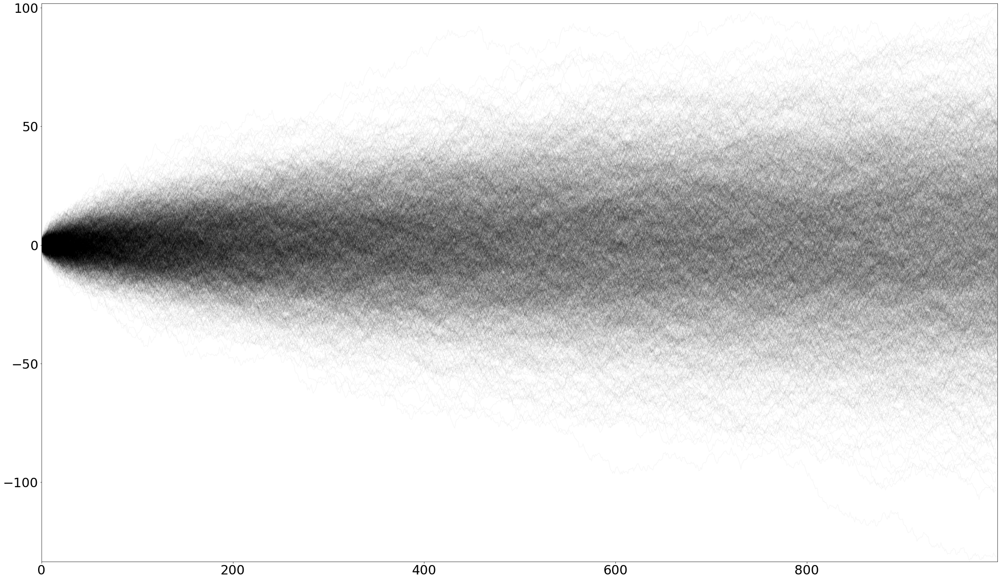

In [6]:
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30

fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, marker=".", markersize = .1, 
                            color ="k", alpha = .035, ax = ax)

plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  import sys


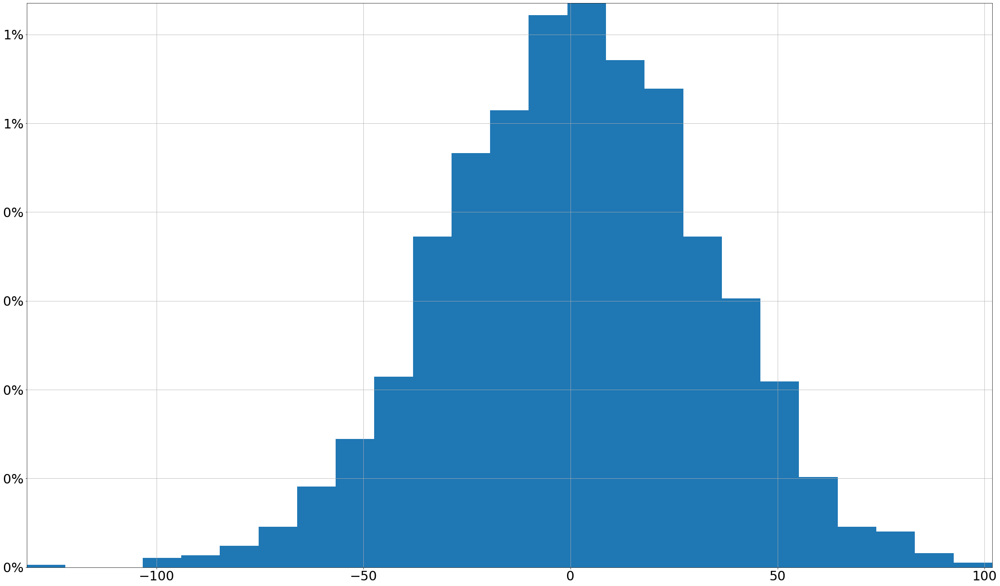

In [7]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.iloc[-1].hist(bins = 25, density = True,
                                ax = ax)

# set vertical axis values as percent
y_vals = ax.get_yticks()
ax.set_yticklabels([str(int(y * 100)) + "%" for y in y_vals])
plt.show()
plt.close()

## Monte Carlo with a Positive Trend

In [10]:
mean = .05
sigma = .5
monte_carlo_sim_dict = {}
num_sims = 2000
periods = 1000
for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    for period in range(periods):
        # create variable that references simulation i
        # in dictionary
        curr_sim = monte_carlo_sim_dict[i]
        if period == 0:
            curr_sim[period] = random.normalvariate(mean, sigma)
        else:
            curr_sim[period] = curr_sim[period - 1] + random.normalvariate(mean, sigma)

monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict)
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.434526,-0.002426,1.163662,-0.060782,-0.865884,0.323098,0.219984,0.235956,-0.402568,0.191036,...,0.095401,-0.457924,0.409514,0.535630,-0.527971,0.084547,0.004445,-0.648376,-0.464858,0.571407
1,-0.147649,-0.052562,0.020723,-0.468804,-0.681252,0.690488,0.267129,-0.629071,-1.044643,0.039791,...,0.478093,-0.941001,0.142557,0.979718,0.077581,-0.025498,-0.189348,-0.591031,-1.156470,0.983609
2,0.344887,-0.750474,0.678251,-0.581546,-1.219668,0.726605,-0.008666,0.023752,-0.771089,0.649533,...,0.474876,-1.234305,-0.106127,0.562790,-0.815177,0.689799,-0.638627,-0.437641,-1.433560,1.236819
3,1.247605,-1.097294,0.091879,-0.495512,-1.290703,0.952506,-0.392900,-0.003814,-1.193845,1.569872,...,0.442270,-0.065297,0.469958,0.758470,-0.656329,0.777650,-0.617577,-0.333642,-1.902688,0.752343
4,1.176863,-0.911782,0.759261,0.414507,-0.975725,1.082173,-0.197725,0.592500,-2.126478,1.691139,...,-0.414145,-0.481955,0.709975,0.774827,-0.626795,1.076042,-1.260344,0.282376,-2.208864,0.765574
5,1.894052,-0.712133,1.031071,0.019723,-0.366981,1.375734,0.511823,0.894821,-1.420253,1.393794,...,-0.207282,-1.097581,0.356832,0.431764,-0.299358,1.546708,-1.030680,0.396037,-2.602263,0.697896
6,1.502978,-1.362513,0.896436,-0.444144,-0.791237,1.259207,0.239186,1.742026,-1.327225,0.697876,...,0.543110,-0.537164,0.563125,-0.033847,-0.244755,0.730092,-0.529761,0.537968,-2.709843,2.079461
7,1.960582,-0.893544,0.721286,-0.433407,-1.540733,1.133537,0.300942,1.001605,-1.167601,0.672137,...,-0.071134,0.001226,0.722413,0.553688,-0.146335,0.847439,-0.857642,0.822692,-1.967940,1.976058
8,1.522426,0.043490,0.753278,-0.723346,-1.160258,1.579561,-0.133726,1.782624,-0.725086,0.552041,...,0.041940,0.338594,0.688224,0.781784,0.518710,0.595420,-1.260891,0.517192,-1.962617,2.692964
9,1.764313,-0.003531,0.448122,-1.073757,-0.731277,2.083666,-1.542858,2.243380,0.630167,0.450062,...,0.407679,0.751850,1.214829,1.410645,0.632186,-0.168131,-1.334915,0.357867,-1.427896,3.790796


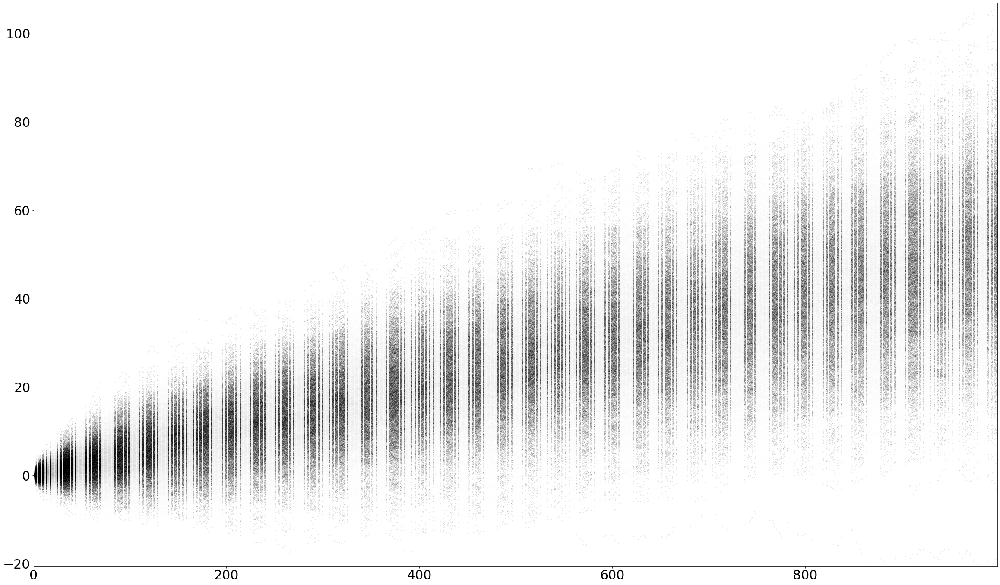

In [14]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.plot.line(legend = False, marker = ".", markersize = .1,
                             ls = " ",
                            color = "k", alpha = .75, ax = ax)
plt.show()
plt.close()

### Calculating Expected Value

In [15]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis = 1)
monte_carlo_sim_df["mean"]

0       0.050390
1       0.108645
2       0.164093
3       0.228179
4       0.271970
5       0.327296
6       0.374726
7       0.441194
8       0.501457
9       0.536878
10      0.576311
11      0.633570
12      0.688509
13      0.742824
14      0.799236
15      0.834280
16      0.886230
17      0.952983
18      0.996565
19      1.044144
20      1.124722
21      1.173692
22      1.244081
23      1.294846
24      1.342597
25      1.385684
26      1.441853
27      1.491533
28      1.534522
29      1.589101
         ...    
970    49.025164
971    49.074476
972    49.124622
973    49.167504
974    49.217025
975    49.282734
976    49.328749
977    49.387132
978    49.435463
979    49.467545
980    49.526477
981    49.571307
982    49.615886
983    49.665022
984    49.716819
985    49.779150
986    49.837485
987    49.889228
988    49.924251
989    49.962761
990    50.011817
991    50.045858
992    50.090613
993    50.141141
994    50.192077
995    50.230033
996    50.260799
997    50.3114

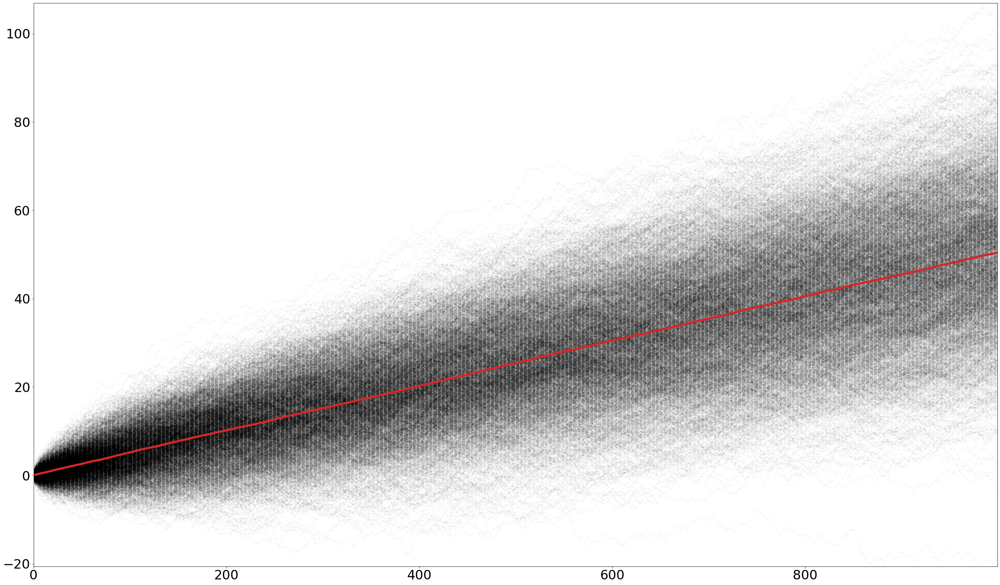

In [22]:
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.drop("mean", inplace = False, axis = 1).plot.line(legend = False, marker = ".", markersize = 5,
                             ls = " ", color = "k", alpha = .025, ax = ax)
monte_carlo_sim_df["mean"].plot.line(legend = False, color = "C3", linewidth = 5, ax = ax)
plt.show()
plt.close()

### Simulating Changes in Portfolio Values

In [20]:
import pandas_datareader.data as web
import datetime

start = datetime.datetime(2005, 1, 1)
end = datetime.datetime.today()

data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.DataReader(name, "yahoo", start, end)

# make a list of the close data for each stock
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)

In [28]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,NaN,NaN,NaN,NaN
2005-01-04,0.003740,0.010270,-0.010742,-0.040501
2005-01-05,-0.002235,0.008758,-0.002068,-0.005090
2005-01-06,-0.001120,0.000775,-0.003109,-0.025632
2005-01-07,-0.002991,0.072812,-0.004366,0.028109
2005-01-10,0.004874,-0.004188,-0.001044,0.006242
2005-01-11,-0.002612,-0.063805,-0.007107,-0.007792
2005-01-12,0.001871,0.013941,0.002211,0.009507
2005-01-13,-0.019044,0.066300,-0.007982,-0.000256


In [46]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace =True)
close_data_normalized

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094170,0.979847,0.956292
2005-01-10,1.002244,1.089588,0.978824,0.962261
2005-01-11,0.999626,1.020066,0.971867,0.954763
2005-01-12,1.001496,1.034287,0.974015,0.963840
2005-01-13,0.982423,1.102860,0.966240,0.963593


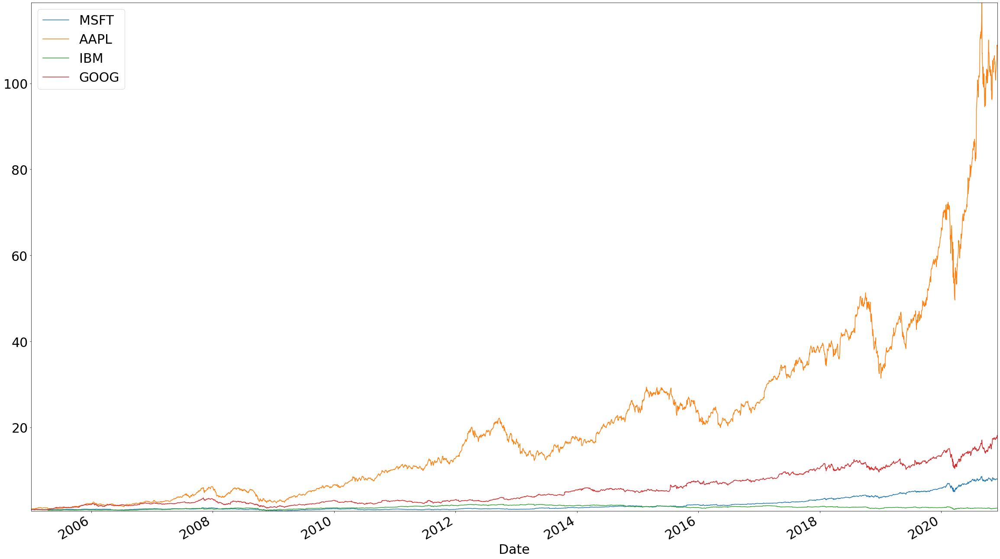

In [29]:
fig, ax = plt.subplots(figsize=(40,24))
close_data_normalized.plot.line(ax = ax)
plt.show()
plt.close()

### Daily Rate of Return

Derive the daily rate of return from the present value equation.

>$PV = \frac{FV}{(1 + r)^t}$
>
>Overall rate of return: $R=\frac{FV}{PV}$

Discount the overall rate of return to find the average rate of return. We will use this to define the mean of the standard normal distribution:

>$ r = (R)^{\frac{1}{t}} - 1$
>
>$t$ is measured in days

In [30]:
mean_var_df = pd.DataFrame({"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
                                1 / close_data_normalized["MSFT"].count()) - 1, 
                            "sigma" : close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000520,0.017292
AAPL,0.001170,0.021046
IBM,0.000061,0.014576
GOOG,0.000723,0.018830


In [32]:
num_sims = 500
dates = list(close_data_df.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    monte_carlo_sim_dict[stock] = {}
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]
    for i in range(num_sims):
        monte_carlo_sim_dict[stock][i] = {}
        curr_sim = monte_carlo_sim_dict[stock][i]
        
        for date in dates:
            curr_sim[date] = random.normalvariate(mean, sigma)
        
    monte_carlo_sim_dict[stock] = pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod()

monte_carlo_sim_dict

{'MSFT':                  0         1         2          3         4         5    \
 2005-01-03  1.036508  1.008797  0.995406   0.978522  0.996110  0.987042   
 2005-01-04  1.042549  1.037803  1.000744   0.975459  1.002171  1.009045   
 2005-01-05  1.034425  1.014798  0.974512   0.975443  1.001902  1.022939   
 2005-01-06  1.032070  1.003475  0.986909   0.980098  0.996842  0.998586   
 2005-01-07  1.021242  0.996156  0.959647   0.974443  0.976049  0.981630   
 2005-01-10  1.010691  1.025354  0.930600   0.970945  0.974775  0.959622   
 2005-01-11  0.999177  1.029559  0.946711   0.981173  0.986027  0.953161   
 2005-01-12  0.993757  1.035479  0.967405   1.003393  0.963507  0.940073   
 2005-01-13  1.021525  1.077177  0.953716   0.996116  0.968642  0.936499   
 2005-01-14  1.028579  1.092507  0.971100   0.997794  0.979246  0.961270   
 2005-01-18  1.012586  1.112009  0.958132   0.990576  0.939793  0.984677   
 2005-01-19  1.022496  1.111603  0.933857   0.978586  0.953543  0.993187   
 200

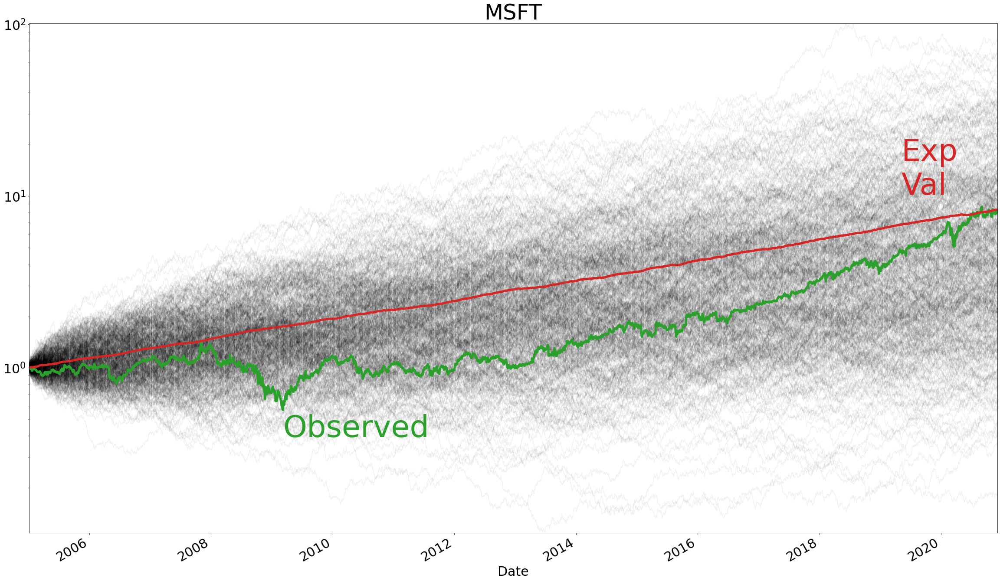

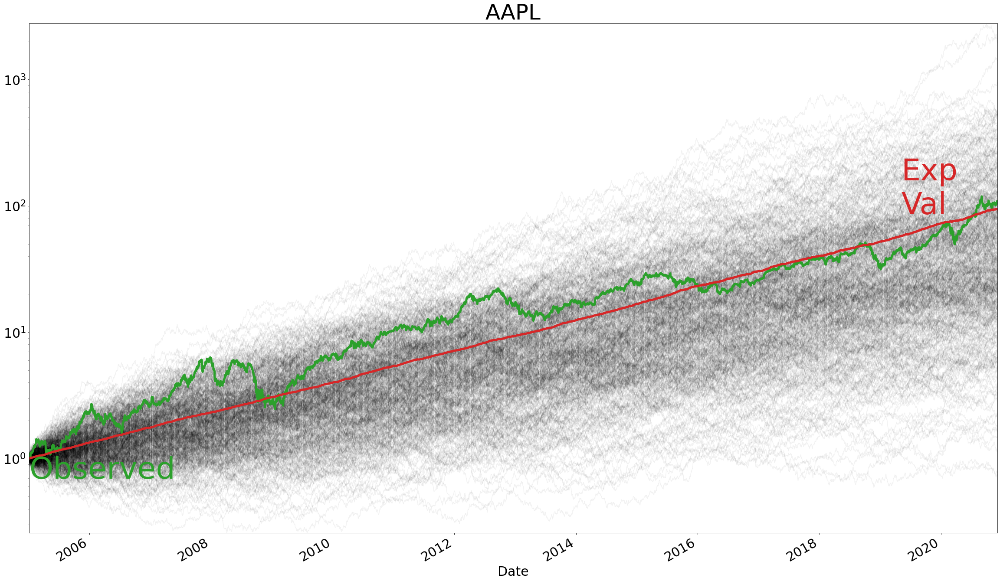

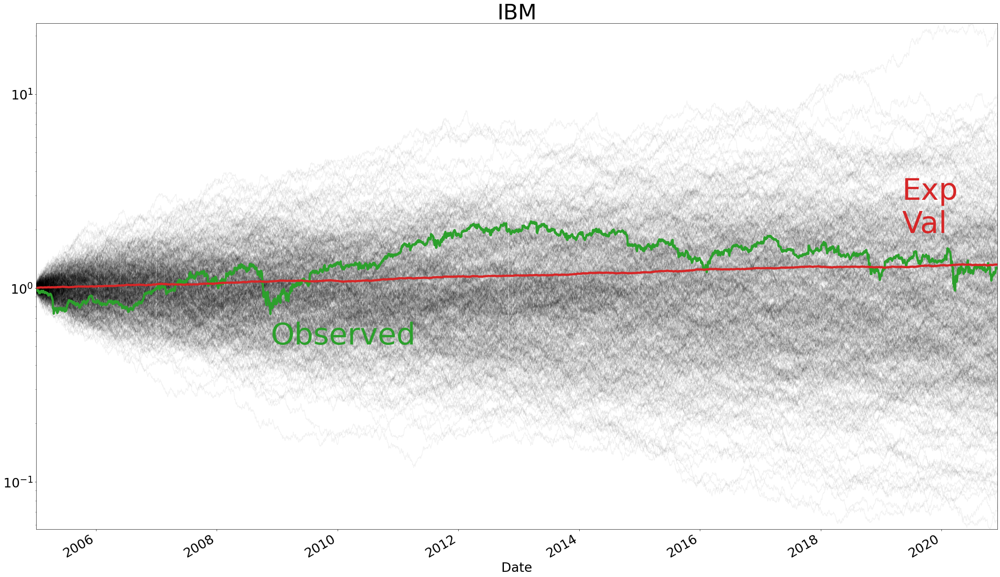

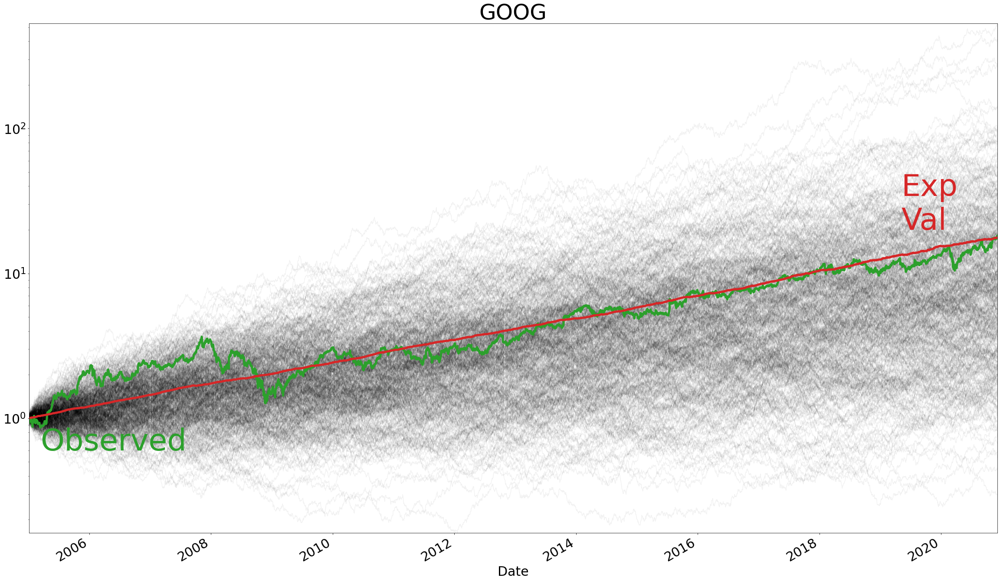

In [34]:
for stock in stocks:
    monte_carlo_sim_dict[stock]["mean"] = monte_carlo_sim_dict[stock].mean(axis=1)
    fig, ax = plt.subplots(figsize = (40, 24))
    monte_carlo_sim_dict[stock].drop("mean", inplace = False, axis = 1).plot.line(
            legend=False, marker =".", markersize = .1, color = "k", alpha = .05, logy = True, ax = ax)
    close_data_normalized[stock].plot.line(legend = False, color = "C2", linewidth = 5, logy = True, ax = ax)
    monte_carlo_sim_dict[stock]["mean"].plot.line(legend = False, color = "C3", linewidth = 5, logy = True, ax = ax)
    
    # find x coordinate of lowest value observed
    obs_text_x = close_data_normalized[close_data_normalized[stock] == close_data_normalized[stock].min()].index
    plt.text(obs_text_x, close_data_normalized[stock].loc[obs_text_x] * .7,
             "Observed", fontsize = 70, color = "C2")
    
    plt.text(dates[-400], monte_carlo_sim_dict[stock]["mean"].iloc[-400] * 1.5, "Exp\nVal",
            fontsize = 70, color = "C3")
    
    
    plt.title(stock, fontsize = 50)
    plt.show()
    plt.close()

## Calculate Portfolio Return

In [35]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights

{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [47]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x :x.mul(portfolio_weights[x.name]), axis = 0).sum(axis=1),
                        columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return
close_data_normalized

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094170,0.979847,0.956292,1.006923
2005-01-10,1.002244,1.089588,0.978824,0.962261,1.008229
2005-01-11,0.999626,1.020066,0.971867,0.954763,0.986581
2005-01-12,1.001496,1.034287,0.974015,0.963840,0.993409
2005-01-13,0.982423,1.102860,0.966240,0.963593,1.003779


<AxesSubplot:xlabel='Date'>

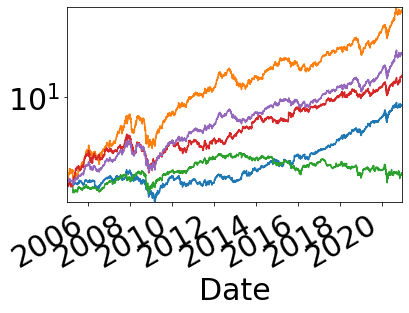

In [52]:
close_data_normalized.plot.line(legend=False, logy = True)

In [53]:
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
ex_return_pct_change

,Portfolio Return
Date,
2005-01-04,-0.009308
2005-01-05,-0.000082
2005-01-06,-0.007033
2005-01-07,0.023667
2005-01-10,0.001297
2005-01-11,-0.021472
2005-01-12,0.006922
2005-01-13,0.010439
2005-01-14,0.004986


In [56]:
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) **(1 / ex_return["Portfolio Return"].count()) -1,
                           "sigma" : ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.00088,0.016607


In [57]:
num_sims = 1000
dates = ex_return.index
monte_carlo_sim_dict = {}
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]

for i in range(num_sims):
    monte_carlo_sim_dict[i] = {}
    curr_sim = monte_carlo_sim_dict[i]
    for date in dates:
        curr_sim[date] = random.normalvariate(mean, sigma)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).add(1).cumprod()
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
2005-01-03,1.003418,1.010003,0.993553,1.016235,1.014803,0.978799,0.989349,0.947830,0.964553,1.012343,...,0.987590,0.992012,1.006631,1.025207,1.015469,1.018471,0.989215,0.960446,1.016882,1.017749
2005-01-04,1.003628,0.997940,0.998035,1.012339,0.982922,0.936842,0.959770,0.928202,0.932169,1.030034,...,1.032811,0.990509,0.997755,0.999089,1.007345,1.026888,0.987796,0.952009,0.994073,1.032139
2005-01-05,0.991086,0.997160,1.005631,1.051683,0.961667,0.935340,0.962583,0.931401,0.936655,1.025469,...,1.054603,1.019748,0.993949,0.994426,1.001300,1.056931,0.986328,0.922679,0.993076,1.025116
2005-01-06,1.026680,0.989227,0.995947,1.065273,0.986466,0.932966,0.946959,0.947534,0.945990,1.025974,...,1.056140,1.005461,0.969123,0.972957,0.999145,1.063785,0.962804,0.919236,1.009453,1.008502
2005-01-07,1.009521,1.006260,1.004061,1.064757,0.979360,0.945039,0.939284,0.963137,0.927961,1.023063,...,1.073474,1.026155,0.974369,0.950203,0.962111,1.047450,0.957515,0.927388,0.998554,1.024846
2005-01-10,1.008555,0.999389,0.991592,1.109524,0.985130,0.920279,0.931114,0.958667,0.912995,1.010825,...,1.072325,1.040591,0.990915,0.953157,0.959147,1.048135,0.985981,0.927175,1.004676,1.032888
2005-01-11,0.997463,0.979234,0.978015,1.070952,0.982359,0.918446,0.944073,0.933890,0.919944,1.017620,...,1.070323,1.027628,1.017681,0.923412,0.986907,1.030008,1.032136,0.926440,1.018099,1.030935
2005-01-12,1.007746,0.976675,0.986798,1.049406,1.014491,0.939455,0.935461,0.948402,0.924924,1.038175,...,1.075288,1.038801,1.027375,0.915658,0.991636,1.014424,1.017466,0.925703,1.029399,1.013612
2005-01-13,1.011417,0.993611,1.016106,1.041149,0.987321,0.916967,0.960448,0.949376,0.912960,1.009100,...,1.067931,1.017633,1.038748,0.922761,0.980530,1.014598,1.025738,0.922748,1.047371,0.990913
2005-01-14,1.012005,0.990858,1.022470,1.035278,1.005192,0.915445,0.961822,0.922433,0.867660,0.982658,...,1.034086,1.014761,1.044501,0.921889,0.982318,0.966721,1.011387,0.907512,1.009666,0.985364


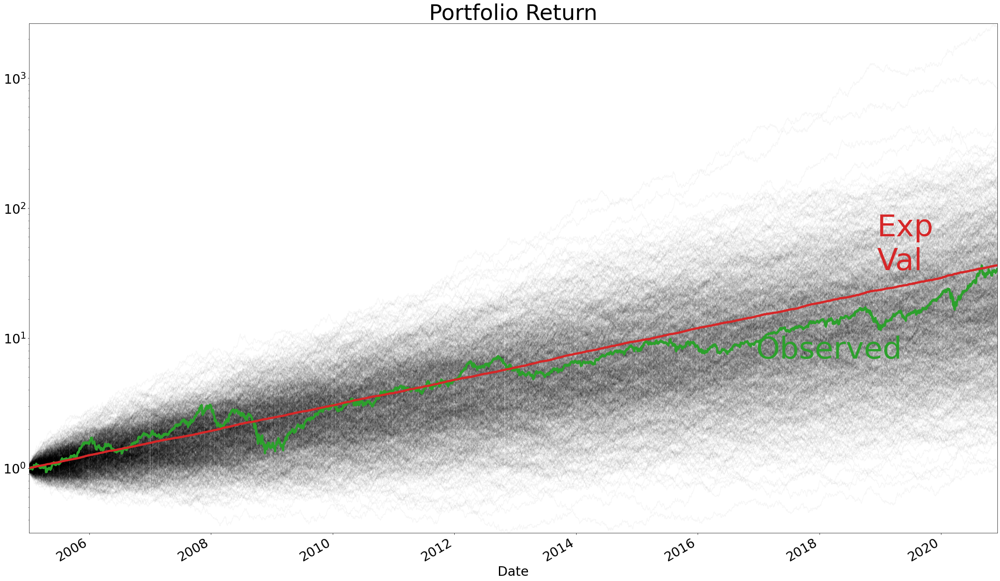

In [58]:
monte_carlo_sim_df["mean"] = monte_carlo_sim_df.mean(axis=1)
fig, ax = plt.subplots(figsize = (40, 24))
monte_carlo_sim_df.drop("mean", inplace = False, axis = 1).plot.line(
                            legend = False, marker=".", markersize = .1, 
                            color ="k", alpha = .035, logy = True, ax = ax)
ex_return.plot.line(legend = False, color ="C2", linewidth = 5, logy = True, 
                    ax = ax)
plt.text(dates[-1000], ex_return["Portfolio Return"].iloc[-1000] * .75 , 
         "Observed", fontsize = 70, color = "C2")
monte_carlo_sim_df["mean"].plot.line(legend = False, color ="C3", 
                                     linewidth = 5, 
                                     logy = True, ax = ax)
plt.text(dates[-500], monte_carlo_sim_df["mean"].iloc[-500] * 1.45, "Exp\nVal", 
          fontsize = 70, color = "C3")

plt.title("Portfolio Return", fontsize = 50)
plt.show()
plt.close()